In [ ]:
import pandas as pd
from PIL import Image
import io
import matplotlib.pyplot as plt
import torch
import random
from google.colab import drive
import torch.nn as nn
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
import numpy as np
from tqdm import tqdm
import torch.optim as optim
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report


In [ ]:
df = pd.read_parquet("hf://datasets/ArianFiroozi/NNDL_HW5_S2025/data/train-00000-of-00001-982530f49cf10cee.parquet")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [ ]:
def check_image_sizes(df, num_samples=10):
    sizes = []
    for i in range(min(num_samples, len(df))):
        img_bytes = df.iloc[i]["image"]["bytes"]
        img = Image.open(io.BytesIO(img_bytes))
        sizes.append(img.size)  # (width, height)
    return sizes
image_sizes = check_image_sizes(df, num_samples=10)
for i, size in enumerate(image_sizes):
    print(f"Image {i+1}: Size = {size}")


Image 1: Size = (256, 256)
Image 2: Size = (256, 256)
Image 3: Size = (256, 256)
Image 4: Size = (256, 256)
Image 5: Size = (256, 256)
Image 6: Size = (256, 256)
Image 7: Size = (256, 256)
Image 8: Size = (256, 256)
Image 9: Size = (256, 256)
Image 10: Size = (256, 256)


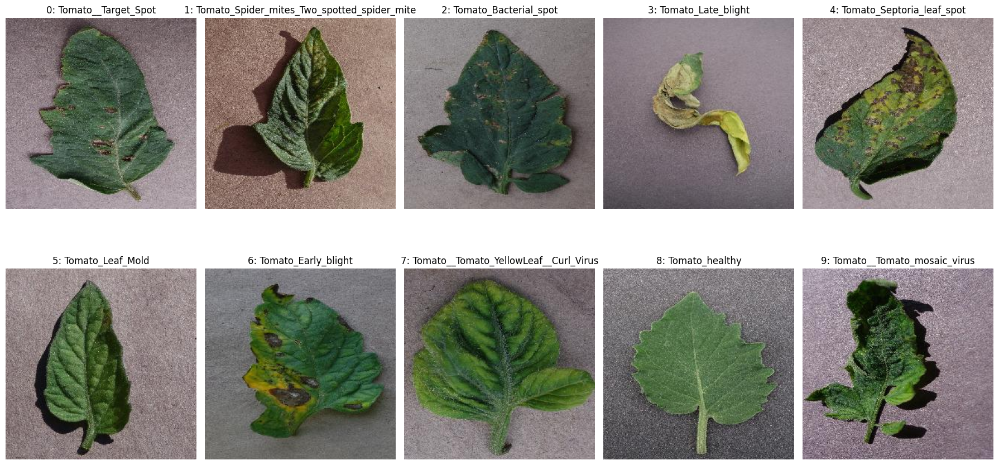

In [ ]:
sampled_df = df.groupby("label").first().reset_index()

plt.figure(figsize=(18, 10))

for idx, row in sampled_df.iterrows():
    img_dict = row["image"]
    img_bytes = img_dict["bytes"]
    image = Image.open(io.BytesIO(img_bytes))

    if image.mode != 'RGB':
        image = image.convert('RGB')

    plt.subplot(2, 5, idx + 1)
    plt.imshow(image)
    plt.title(f"{row['label']}: {row['disease_name']}")
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
class_counts = df.groupby(["label", "disease_name"]).size().reset_index(name="count")
class_counts = class_counts.sort_values("label")
print(class_counts)


   label                                 disease_name  count
0      0                          Tomato__Target_Spot   1000
1      1  Tomato_Spider_mites_Two_spotted_spider_mite   1000
2      2                        Tomato_Bacterial_spot   1000
3      3                           Tomato_Late_blight   1000
4      4                    Tomato_Septoria_leaf_spot   1000
5      5                             Tomato_Leaf_Mold    952
6      6                          Tomato_Early_blight   1000
7      7        Tomato__Tomato_YellowLeaf__Curl_Virus   1000
8      8                               Tomato_healthy   1000
9      9                  Tomato__Tomato_mosaic_virus    373


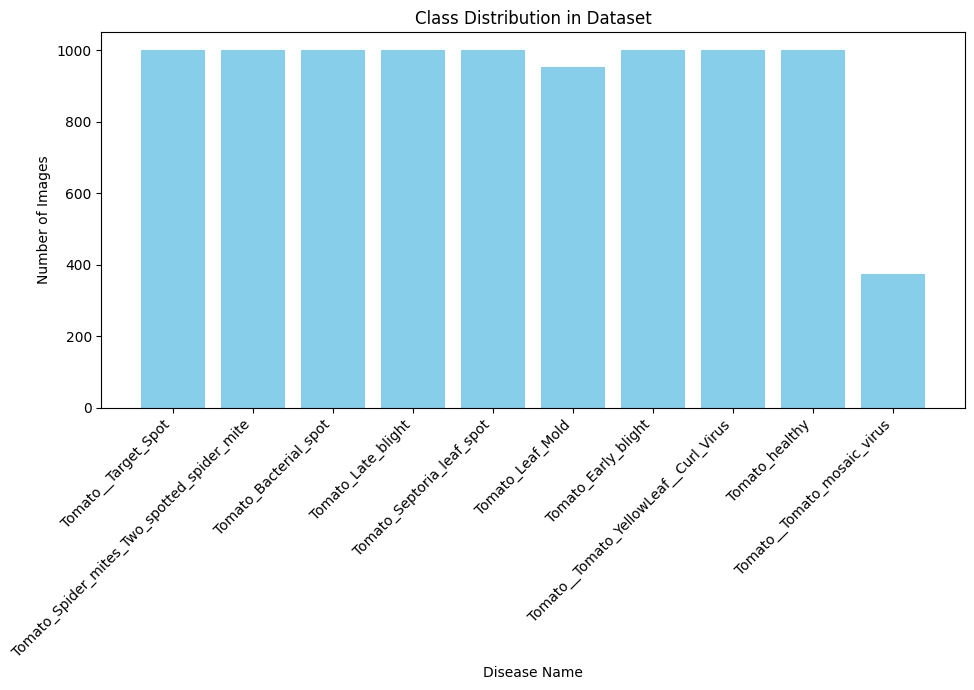

In [ ]:
plt.figure(figsize=(10, 7))
plt.bar(class_counts["disease_name"], class_counts["count"], color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.xlabel("Disease Name")
plt.ylabel("Number of Images")
plt.title("Class Distribution in Dataset")
plt.tight_layout()
plt.show()

#تقویت داده

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
class9_df = df[df["label"] == 9].reset_index(drop=True)
required_augmented = 1000 - len(class9_df)
augmentation_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.2),
    transforms.RandomRotation(degrees=10, fill=0),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.05),
    transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)),
    transforms.RandomAffine(degrees=5, translate=(0.05, 0.05), scale=(1.0, 1.0), shear=5, fill=0),
    transforms.ToTensor()
])

In [ ]:
augmented_records = []

while len(augmented_records) < required_augmented:
    for idx, row in class9_df.iterrows():
        img_bytes = row["image"]["bytes"]
        image = Image.open(io.BytesIO(img_bytes)).convert('RGB')

        augmented_tensor = augmentation_transforms(image)

        augmented_img = transforms.ToPILImage()(augmented_tensor)

        buffer = io.BytesIO()
        augmented_img.save(buffer, format="JPEG")
        new_bytes = buffer.getvalue()

        augmented_records.append({
            "image": {"bytes": new_bytes},
            "label": row["label"],
            "disease_name": row["disease_name"]
        })

        if len(augmented_records) >= required_augmented:
            break

In [ ]:
df_aug = pd.DataFrame(augmented_records)

df_final = pd.concat([df, df_aug], ignore_index=True)
save_path = "/content/drive/MyDrive/tomato_balanced_dataset.parquet"
df_final.to_parquet(save_path, index=False)

print(f" ذخیره شد! مسیر فایل: {save_path}")


 ذخیره شد! مسیر فایل: /content/drive/MyDrive/tomato_balanced_dataset.parquet


In [ ]:
new_df = pd.read_parquet('/content/drive/MyDrive/tomato_balanced_dataset.parquet')

In [ ]:
print("تعداد کل نمونه‌ها:", len(new_df))

تعداد کل نمونه‌ها: 9952


In [ ]:
print(new_df['label'].value_counts())

label
7    1000
1    1000
2    1000
8    1000
4    1000
9    1000
0    1000
6    1000
3    1000
5     952
Name: count, dtype: int64


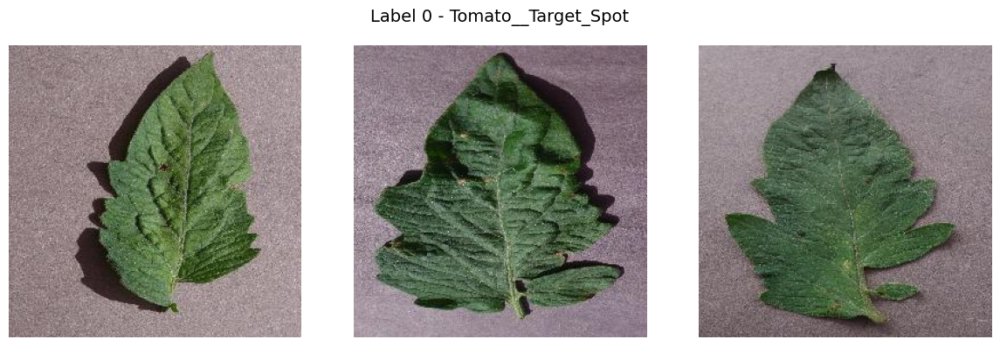

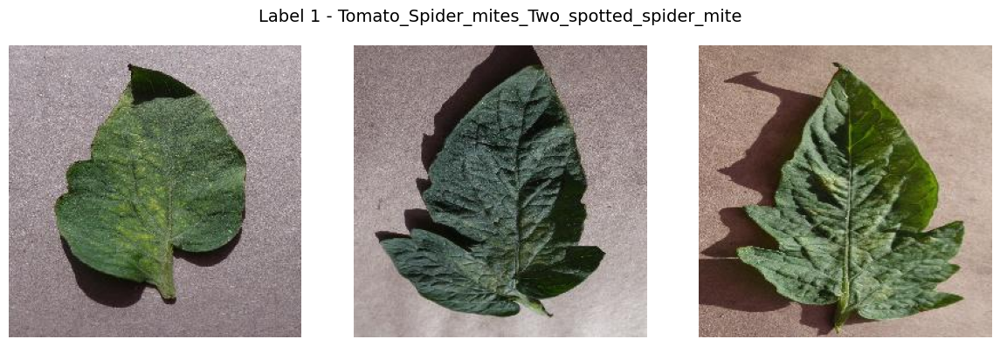

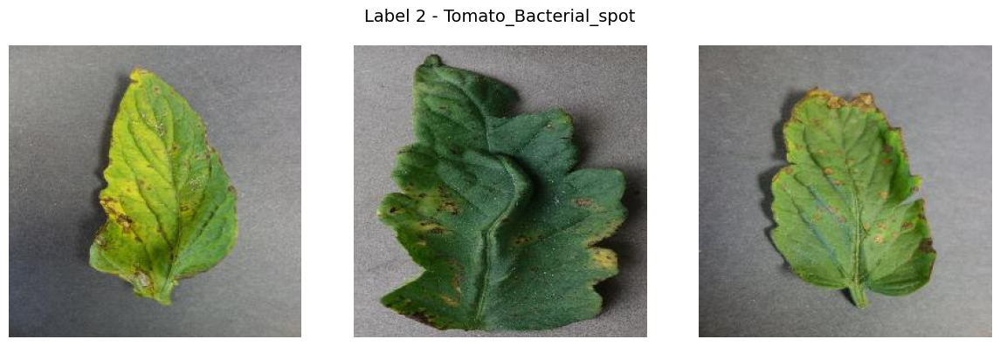

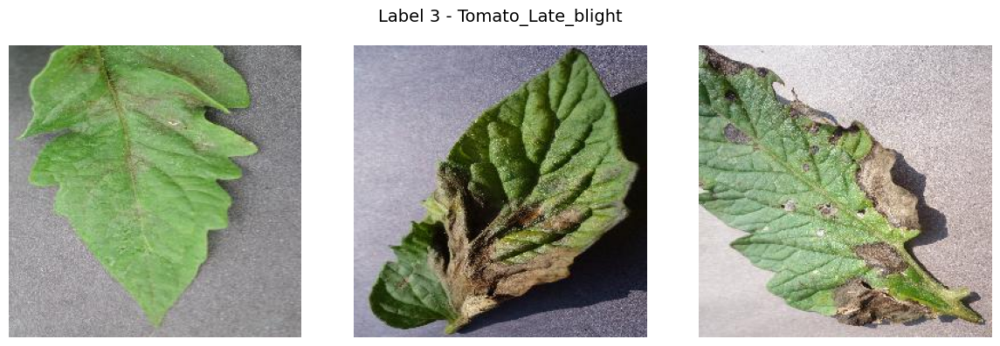

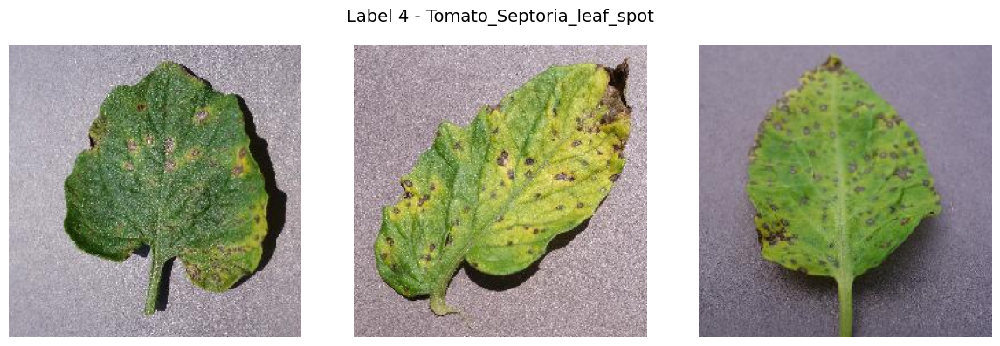

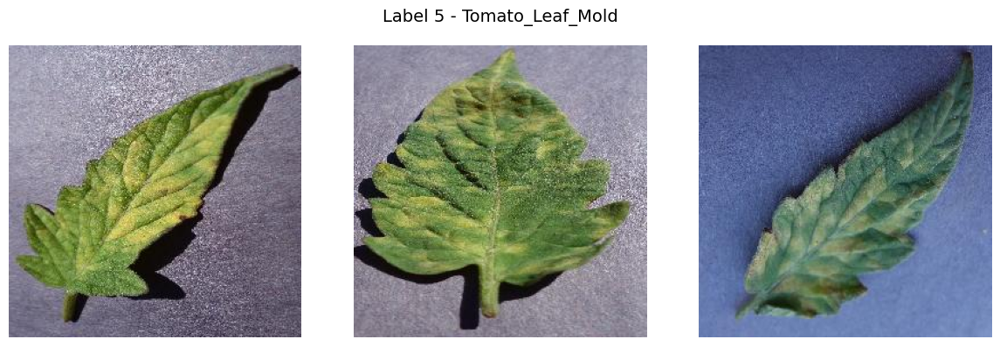

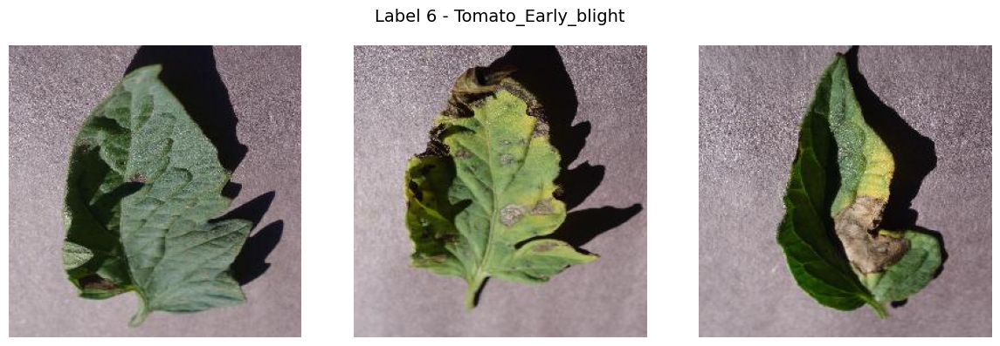

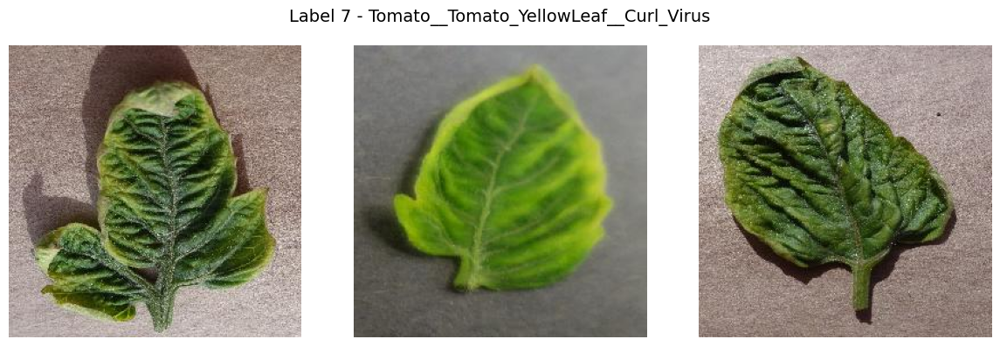

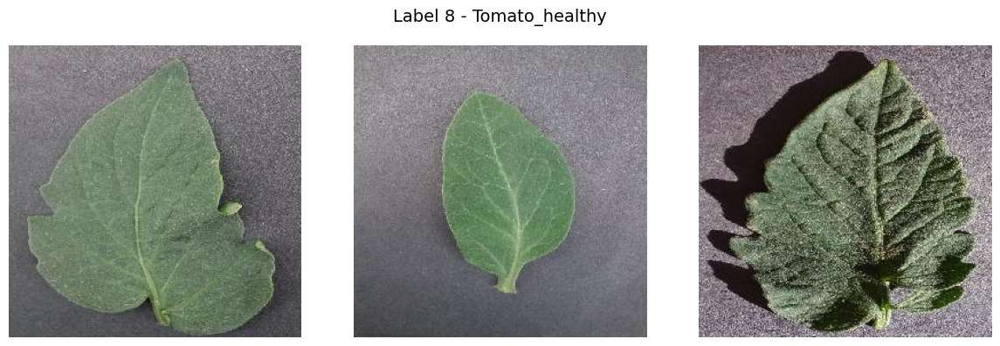

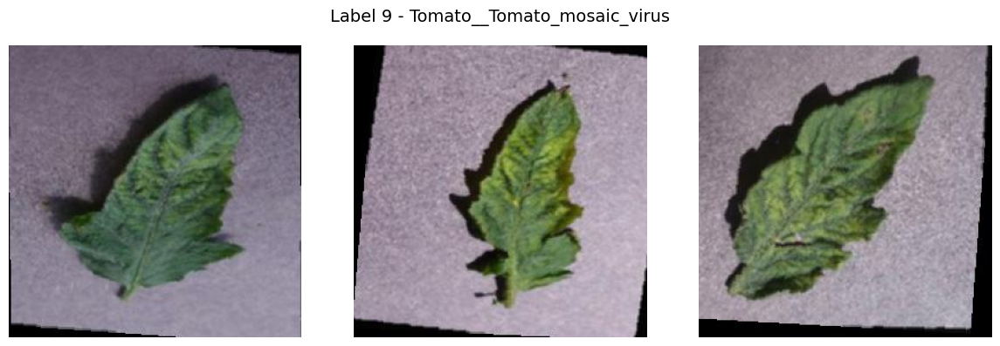

In [ ]:
num_samples_per_class = 3
classes = new_df['label'].unique()
for label in sorted(classes):
    class_df = new_df[new_df['label'] == label].sample(n=num_samples_per_class, random_state=42)
    fig, axes = plt.subplots(1, num_samples_per_class, figsize=(12, 4))
    fig.suptitle(f"Label {label} - {class_df['disease_name'].iloc[0]}", fontsize=14)

    for i, (_, row) in enumerate(class_df.iterrows()):
        img_bytes = row['image']['bytes']
        image = Image.open(io.BytesIO(img_bytes)).convert('RGB')
        axes[i].imshow(image)
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()


#تقسیم داده به آموزش و اعتبارسنجی

In [ ]:
new_df = pd.read_parquet('/content/drive/MyDrive/tomato_balanced_dataset.parquet')

In [ ]:
from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(
    new_df,
    test_size=0.2,
    stratify=new_df['label'],
    random_state=42
)

print(f"تعداد نمونه‌های آموزش: {len(train_df)}")
print(f"تعداد نمونه‌های اعتبارسنجی: {len(val_df)}")
train_df.to_parquet('/content/drive/MyDrive/tomato_train_dataset.parquet', index=False)
val_df.to_parquet('/content/drive/MyDrive/tomato_val_dataset.parquet', index=False)


تعداد نمونه‌های آموزش: 7961
تعداد نمونه‌های اعتبارسنجی: 1991


#مشترک

In [ ]:
train_df = pd.read_parquet('/content/drive/MyDrive/tomato_train_dataset.parquet')
val_df = pd.read_parquet('/content/drive/MyDrive/tomato_val_dataset.parquet')
print(train_df.head())


                                               image  label  \
0  {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...      2   
1  {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...      2   
2  {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...      3   
3  {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...      9   
4  {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...      3   

                  disease_name  
0        Tomato_Bacterial_spot  
1        Tomato_Bacterial_spot  
2           Tomato_Late_blight  
3  Tomato__Tomato_mosaic_virus  
4           Tomato_Late_blight  


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [ ]:
NUM_CLASSES = 10
EPOCHS = 30

In [ ]:
class TomatoDataset(Dataset):
    def __init__(self, dataframe, class_list=None, transform=None):
        self.df = dataframe
        self.transform = transform
        if class_list is None:
            self.classes = sorted(self.df['disease_name'].unique())
        else:
            self.classes = class_list
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_dict = self.df.iloc[idx]['image']
        img_bytes = img_dict['bytes']
        label = self.class_to_idx[self.df.iloc[idx]['disease_name']]
        image = Image.open(io.BytesIO(img_bytes)).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label


In [ ]:
all_classes = sorted(list(set(train_df['disease_name'].unique()) | set(val_df['disease_name'].unique())))


#CNN


In [ ]:
transform_cnn_train = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

transform_cnn_val = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

train_dataset = TomatoDataset(train_df, class_list=all_classes, transform=transform_cnn_train)
val_dataset = TomatoDataset(val_df, class_list=all_classes, transform=transform_cnn_val)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)


In [ ]:
model = models.inception_v3(weights=None, aux_logits=False)
model.fc = nn.Linear(model.fc.in_features, 10)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

train_losses, val_losses, train_accs, val_accs = [], [], [], []

for epoch in range(EPOCHS):
    model.train()
    total_loss, correct, total = 0, 0, 0
    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        outputs = model(imgs)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        preds = outputs.argmax(1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    train_losses.append(total_loss / len(train_loader))
    train_accs.append(correct / total)

    model.eval()
    val_loss, correct, total = 0, 0, 0
    all_preds, all_labels = [], []
    with torch.no_grad():
        for imgs, labels in val_loader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            loss = criterion(outputs, labels)

            val_loss += loss.item()
            preds = outputs.argmax(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_losses.append(val_loss / len(val_loader))
    val_accs.append(correct / total)

    print(f"Epoch {epoch+1}/30: Train Loss={train_losses[-1]:.4f}, Train Acc={train_accs[-1]:.4f}, Val Loss={val_losses[-1]:.4f}, Val Acc={val_accs[-1]:.4f}")


Epoch 1/30: Train Loss=1.1707, Train Acc=0.6001, Val Loss=0.6470, Val Acc=0.7685
Epoch 2/30: Train Loss=0.6917, Train Acc=0.7666, Val Loss=0.4802, Val Acc=0.8322
Epoch 3/30: Train Loss=0.5827, Train Acc=0.8028, Val Loss=0.4806, Val Acc=0.8282
Epoch 4/30: Train Loss=0.4392, Train Acc=0.8518, Val Loss=0.2866, Val Acc=0.9021
Epoch 5/30: Train Loss=0.3329, Train Acc=0.8843, Val Loss=0.2683, Val Acc=0.9041
Epoch 6/30: Train Loss=0.3322, Train Acc=0.8867, Val Loss=0.2795, Val Acc=0.9116
Epoch 7/30: Train Loss=0.2716, Train Acc=0.9091, Val Loss=0.2279, Val Acc=0.9257
Epoch 8/30: Train Loss=0.2394, Train Acc=0.9191, Val Loss=0.1882, Val Acc=0.9382
Epoch 9/30: Train Loss=0.2341, Train Acc=0.9210, Val Loss=0.2018, Val Acc=0.9297
Epoch 10/30: Train Loss=0.2316, Train Acc=0.9224, Val Loss=0.1397, Val Acc=0.9493
Epoch 11/30: Train Loss=0.2121, Train Acc=0.9305, Val Loss=0.1388, Val Acc=0.9528
Epoch 12/30: Train Loss=0.1964, Train Acc=0.9342, Val Loss=0.1166, Val Acc=0.9613
Epoch 13/30: Train Loss=0

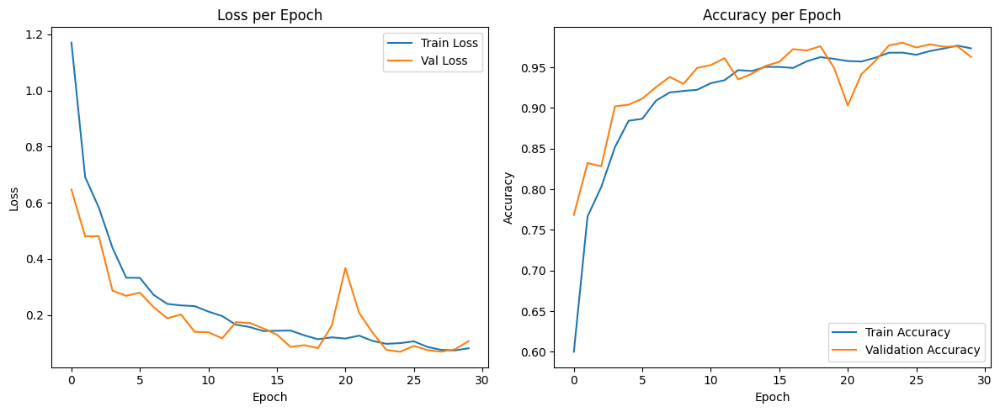

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.title("Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accs, label='Train Accuracy')
plt.plot(val_accs, label='Validation Accuracy')
plt.title("Accuracy per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
import seaborn as sns


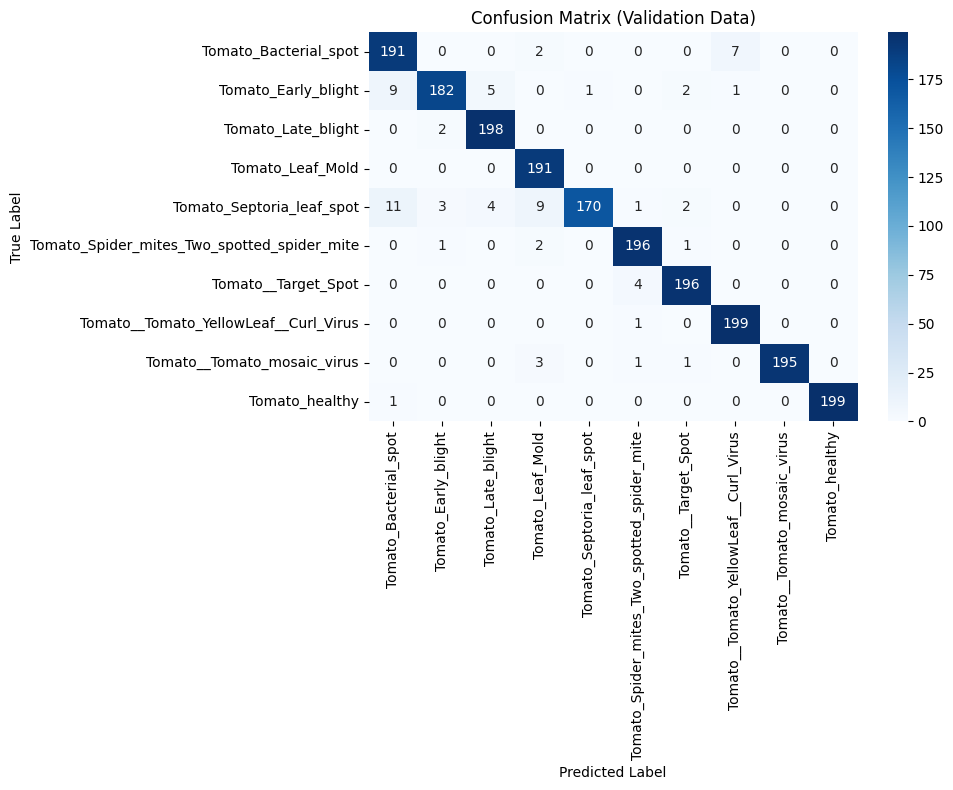

 Classification Report:

                                             precision    recall  f1-score   support

                      Tomato_Bacterial_spot       0.90      0.95      0.93       200
                        Tomato_Early_blight       0.97      0.91      0.94       200
                         Tomato_Late_blight       0.96      0.99      0.97       200
                           Tomato_Leaf_Mold       0.92      1.00      0.96       191
                  Tomato_Septoria_leaf_spot       0.99      0.85      0.92       200
Tomato_Spider_mites_Two_spotted_spider_mite       0.97      0.98      0.97       200
                        Tomato__Target_Spot       0.97      0.98      0.98       200
      Tomato__Tomato_YellowLeaf__Curl_Virus       0.96      0.99      0.98       200
                Tomato__Tomato_mosaic_virus       1.00      0.97      0.99       200
                             Tomato_healthy       1.00      0.99      1.00       200

                                   acc

In [ ]:
class_names = val_dataset.classes
cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)

plt.title("Confusion Matrix (Validation Data)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

print(" Classification Report:\n")
print(classification_report(all_labels, all_preds, target_names=class_names))

#Vit

In [ ]:
import timm
import torch.nn as nn
import torch.nn.functional as F
from einops import rearrange
import math

In [ ]:


class PatchEmbedding(nn.Module):
    def __init__(self, img_size=64, patch_size=8, in_chans=3, embed_dim=64):
        super().__init__()
        self.img_size = img_size
        self.patch_size = patch_size
        self.num_patches = (img_size // patch_size) ** 2
        self.proj = nn.Conv2d(in_chans, embed_dim, kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        x = self.proj(x)
        x = x.flatten(2)
        x = x.transpose(1, 2)
        return x


class TransformerBlock(nn.Module):
    def __init__(self, dim, num_heads, mlp_ratio=2.0, dropout=0.1):
        super().__init__()
        self.norm1 = nn.LayerNorm(dim)
        self.attn = nn.MultiheadAttention(embed_dim=dim, num_heads=num_heads, dropout=dropout)
        self.norm2 = nn.LayerNorm(dim)
        self.mlp = nn.Sequential(
            nn.Linear(dim, int(dim * mlp_ratio)),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(int(dim * mlp_ratio), dim),
            nn.Dropout(dropout),
        )

    def forward(self, x):
        x_ = self.norm1(x)
        attn_output, _ = self.attn(x_, x_, x_)
        x = x + attn_output
        x_ = self.norm2(x)
        x = x + self.mlp(x_)
        return x


class ViTCustom(nn.Module):
    def __init__(self, img_size=64, patch_size=8, in_chans=3, num_classes=10,
                 embed_dim=64, depth=8, num_heads=2, mlp_ratio=2.0, dropout=0.1):
        super().__init__()

        self.patch_embed = PatchEmbedding(img_size, patch_size, in_chans, embed_dim)
        num_patches = self.patch_embed.num_patches

        self.cls_token = nn.Parameter(torch.zeros(1, 1, embed_dim))
        self.pos_embed = nn.Parameter(torch.zeros(1, num_patches + 1, embed_dim))
        self.pos_drop = nn.Dropout(p=dropout)

        self.blocks = nn.ModuleList([
            TransformerBlock(embed_dim, num_heads, mlp_ratio, dropout) for _ in range(depth)
        ])

        self.norm = nn.LayerNorm(embed_dim)
        self.head = nn.Linear(embed_dim, num_classes)

        # Initialization
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        nn.init.trunc_normal_(self.cls_token, std=0.02)
        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            nn.init.trunc_normal_(m.weight, std=0.02)
            if m.bias is not None:
                nn.init.zeros_(m.bias)
        elif isinstance(m, nn.LayerNorm):
            nn.init.zeros_(m.bias)
            nn.init.ones_(m.weight)

    def forward(self, x):
        extra_layer_outputs = {}
        B = x.shape[0]
        patch_embed_tensor = self.patch_embed(x)

        cls_tokens = self.cls_token.expand(B, -1, -1)
        x = torch.cat((cls_tokens, patch_embed_tensor), dim=1)
        extra_layer_outputs['cls_token_added'] = x.shape

        x = x + self.pos_embed
        extra_layer_outputs['pos_embedding_added'] = x.shape
        x = self.pos_drop(x)

        x = x.transpose(0, 1)

        block_shapes = []
        for i, blk in enumerate(self.blocks):
            x = blk(x)
            block_shapes.append(x.shape)
        extra_layer_outputs['transformer_blocks'] = block_shapes

        x = self.norm(x)
        extra_layer_outputs['norm'] = x.shape

        x = x[0]
        out = self.head(x)
        extra_layer_outputs['head_output'] = out.shape

        return out, {'patch_embed_tensor': patch_embed_tensor}, extra_layer_outputs



In [ ]:
transform_vit_train = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

transform_vit_val = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

train_dataset = TomatoDataset(train_df, class_list=all_classes, transform=transform_vit_train)
val_dataset = TomatoDataset(val_df, class_list=all_classes, transform=transform_vit_val)

train_loader = DataLoader(train_dataset, batch_size=256, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=256, shuffle=False)


Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


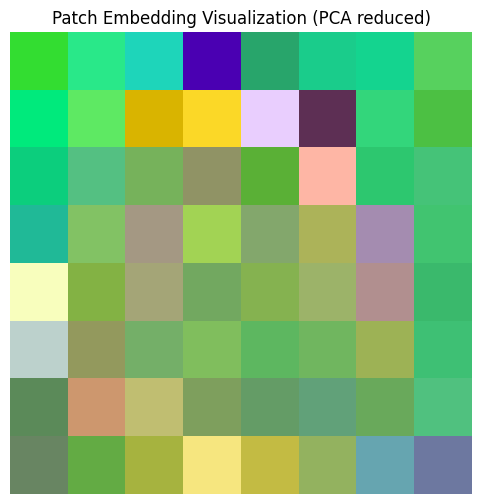

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


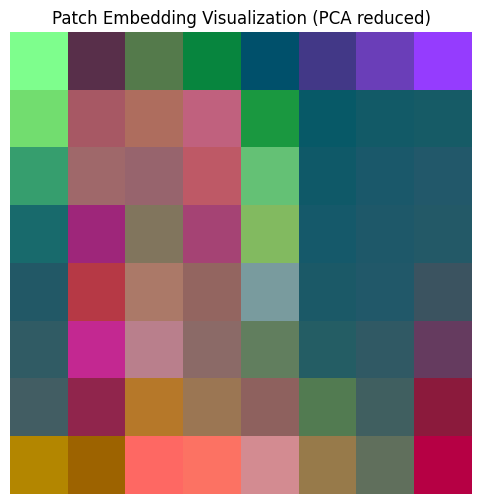

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


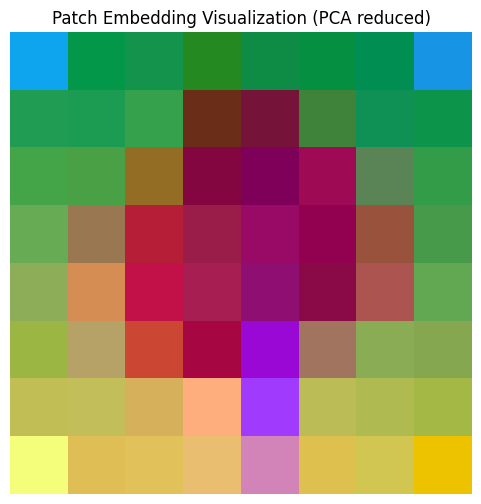

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


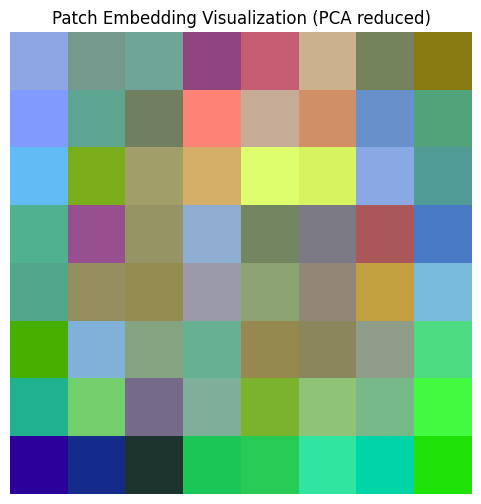

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


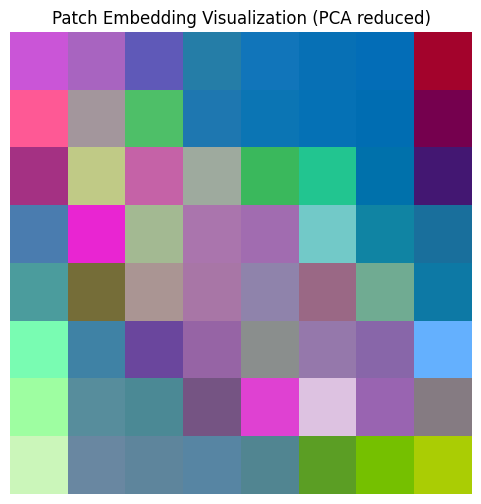

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


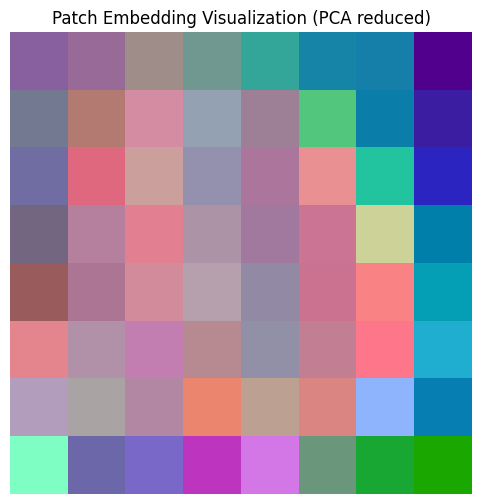

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


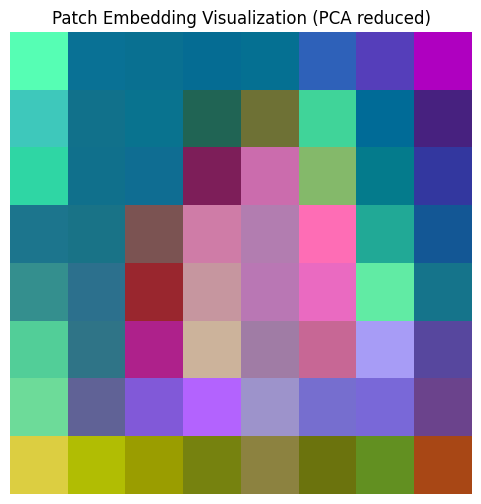

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


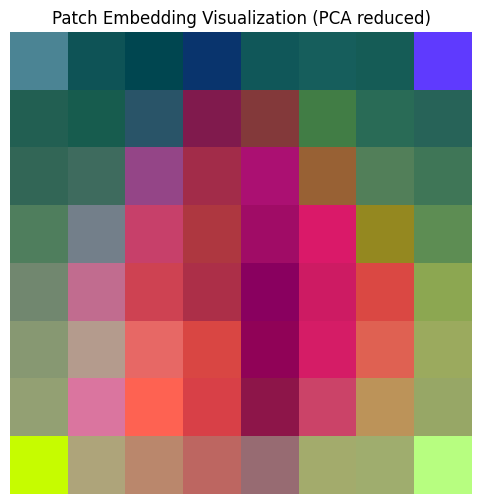

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


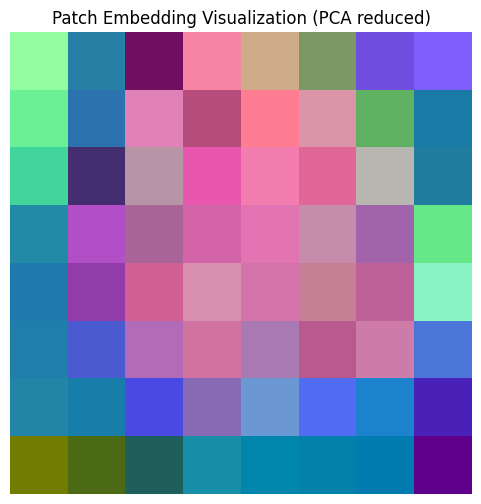

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


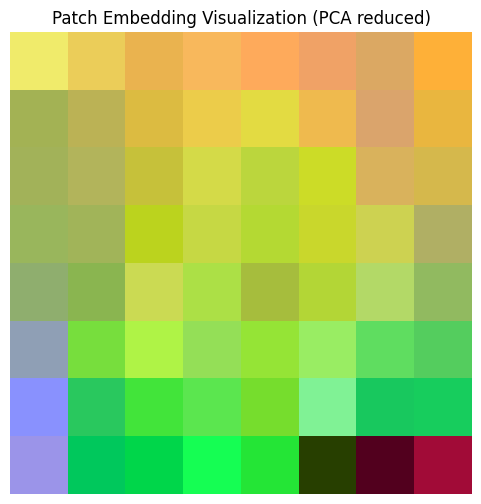

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


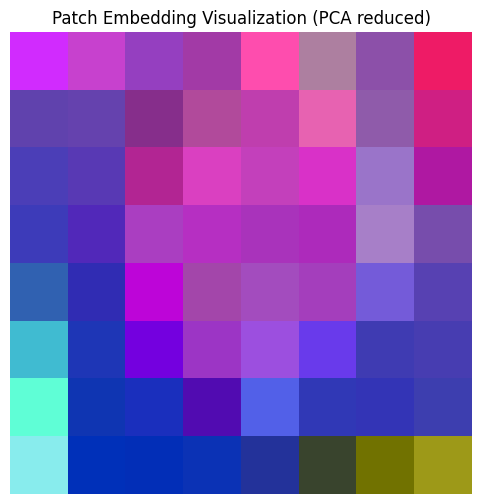

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


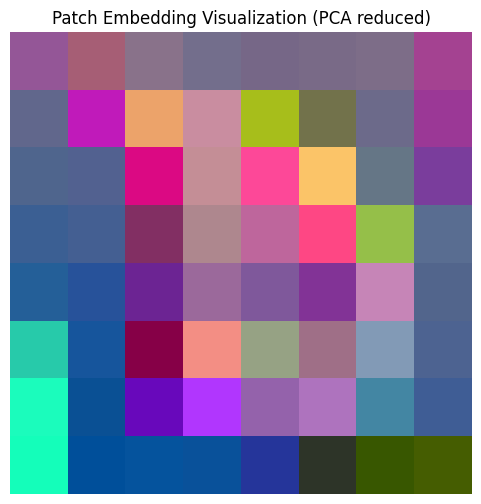

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


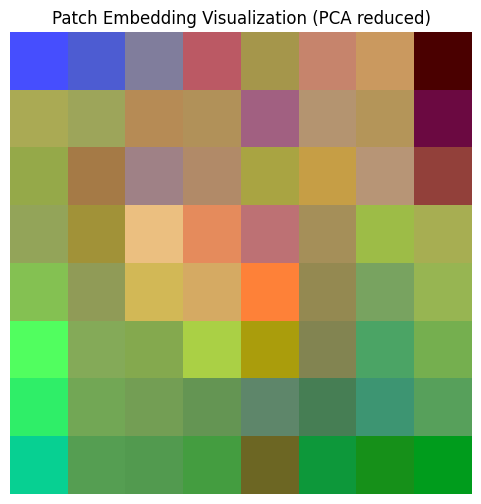

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


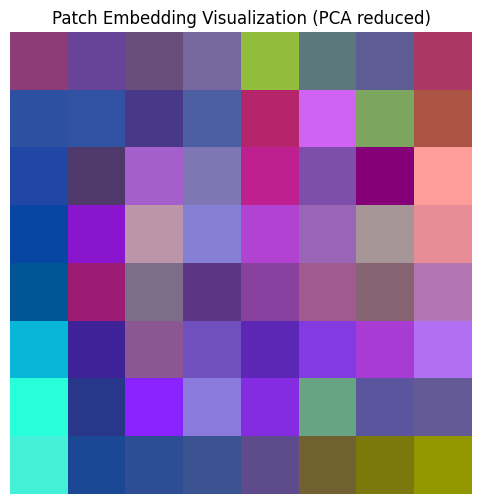

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


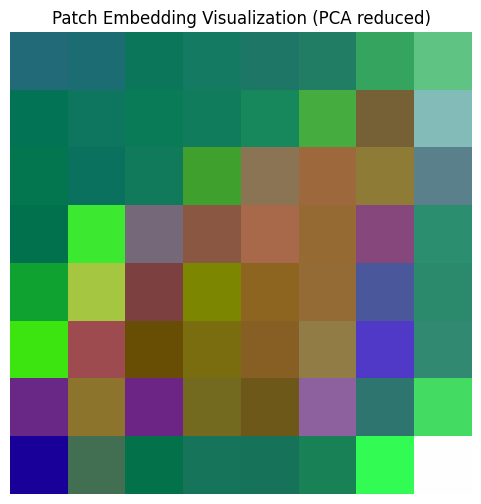

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


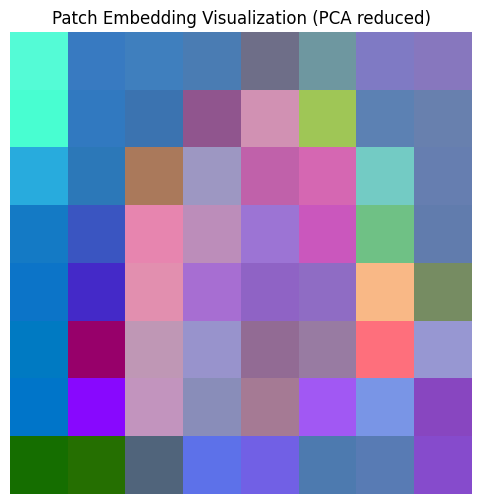

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


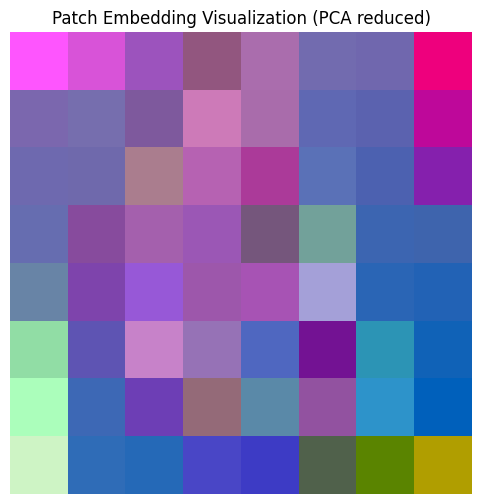

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


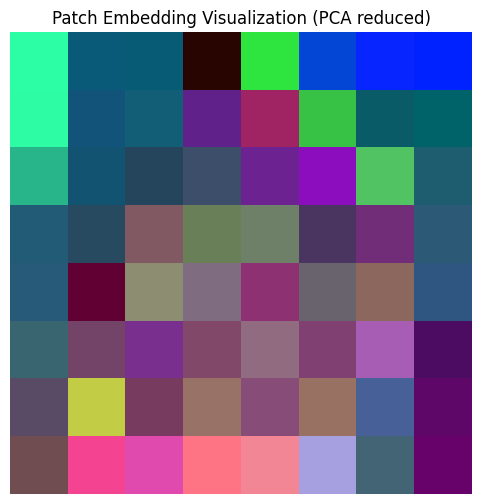

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


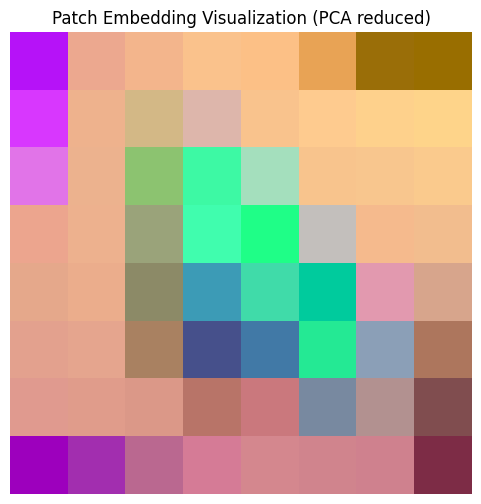

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


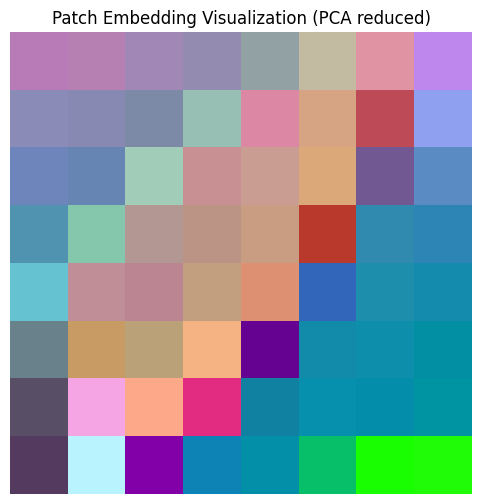

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


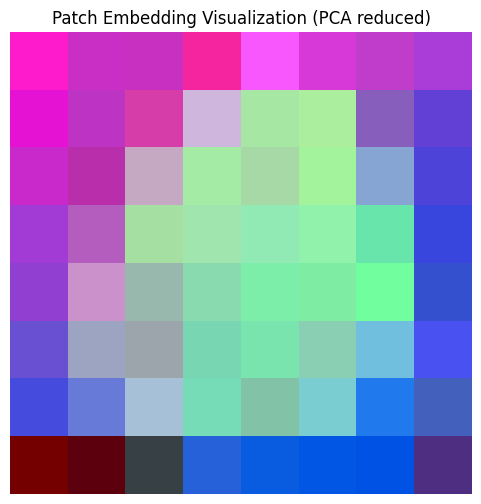

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


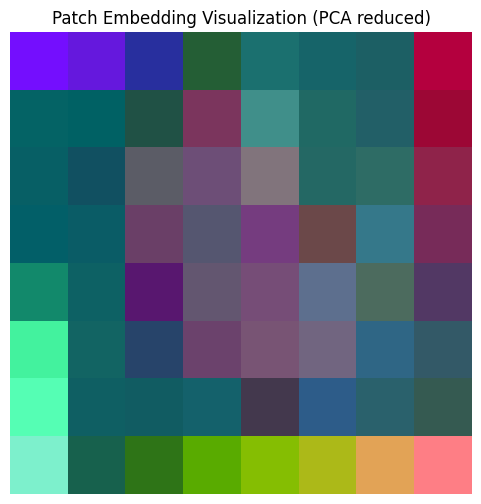

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


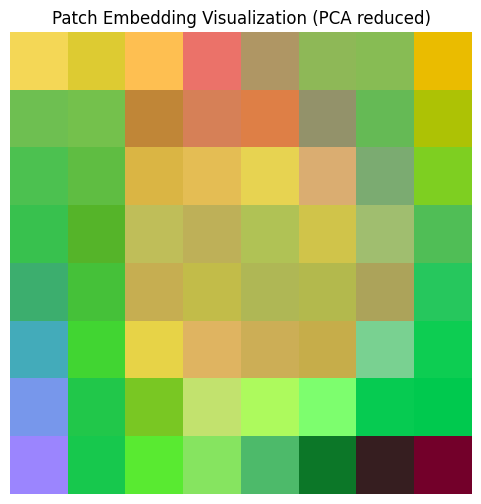

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


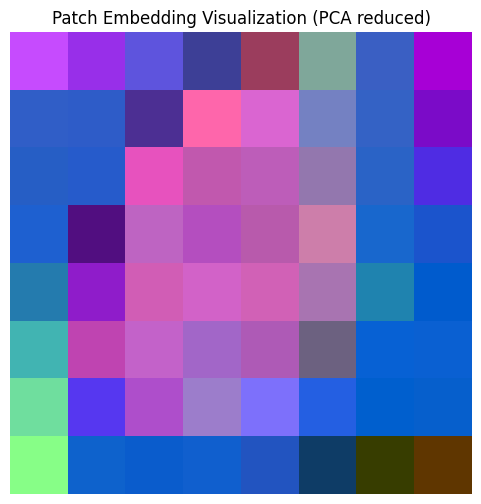

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


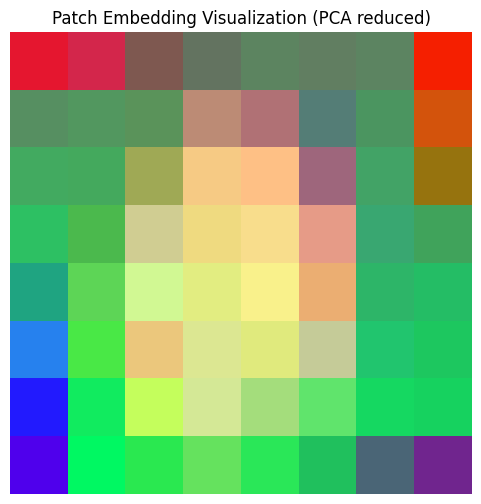

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


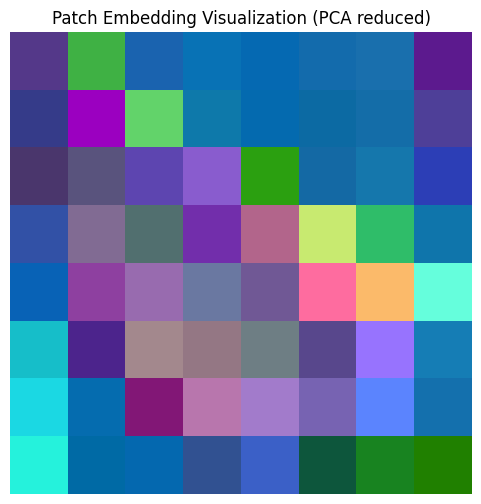

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


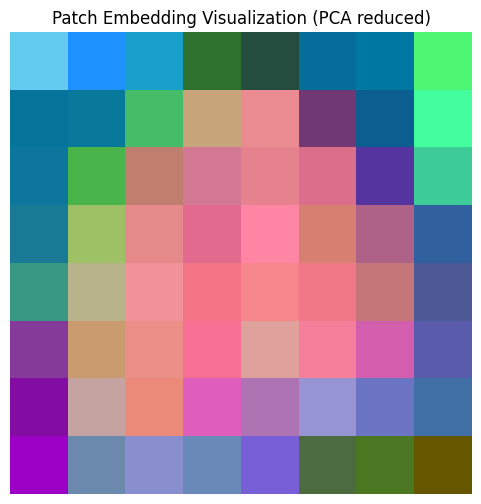

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


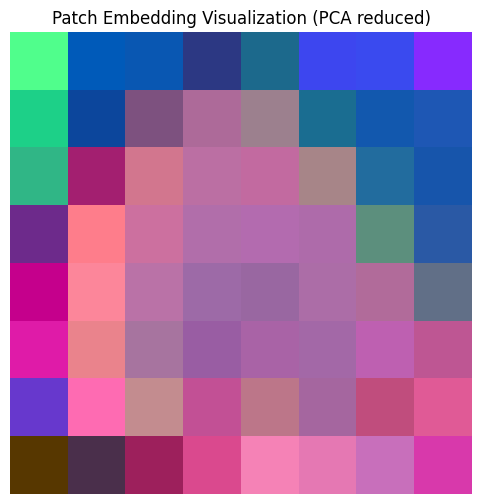

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


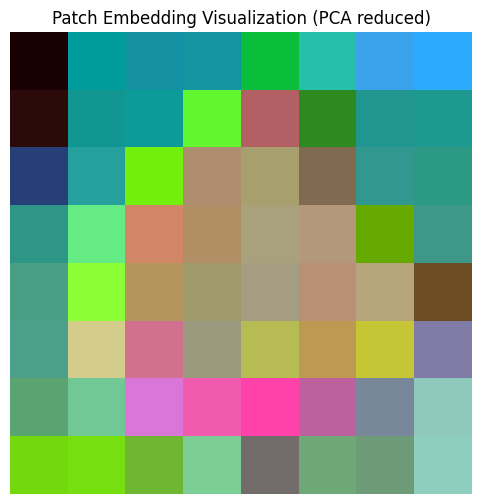

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


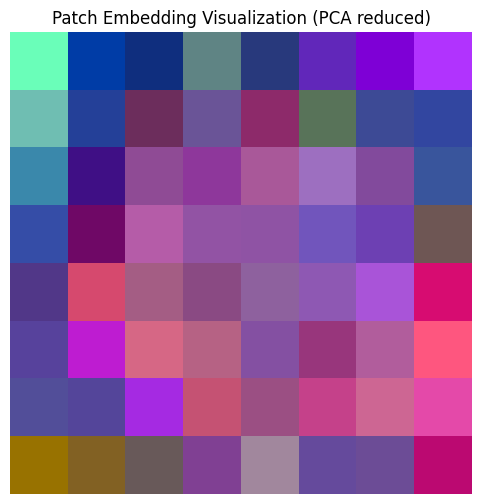

Layer outputs shapes: {'cls_token_added': torch.Size([256, 65, 64]), 'pos_embedding_added': torch.Size([256, 65, 64]), 'transformer_blocks': [torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64]), torch.Size([65, 256, 64])], 'norm': torch.Size([65, 256, 64]), 'head_output': torch.Size([256, 10])}


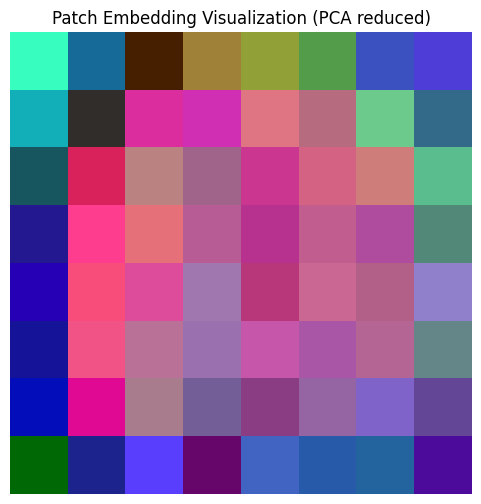

Layer outputs shapes: {'cls_token_added': torch.Size([25, 65, 64]), 'pos_embedding_added': torch.Size([25, 65, 64]), 'transformer_blocks': [torch.Size([65, 25, 64]), torch.Size([65, 25, 64]), torch.Size([65, 25, 64]), torch.Size([65, 25, 64]), torch.Size([65, 25, 64]), torch.Size([65, 25, 64]), torch.Size([65, 25, 64]), torch.Size([65, 25, 64])], 'norm': torch.Size([65, 25, 64]), 'head_output': torch.Size([25, 10])}


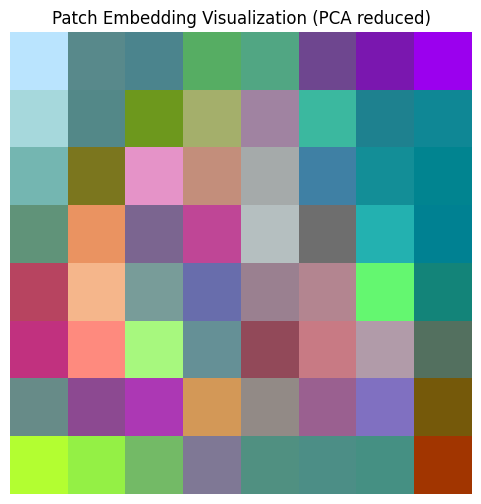

Epoch [1/30] Train Loss: 2.1013 Train Acc: 0.3008 Val Loss: 1.9448 Val Acc: 0.4129
Epoch [2/30] Train Loss: 1.8997 Train Acc: 0.4177 Val Loss: 1.7635 Val Acc: 0.4972
Epoch [3/30] Train Loss: 1.7564 Train Acc: 0.4982 Val Loss: 1.6197 Val Acc: 0.6128
Epoch [4/30] Train Loss: 1.6170 Train Acc: 0.5777 Val Loss: 1.4952 Val Acc: 0.6665
Epoch [5/30] Train Loss: 1.4901 Train Acc: 0.6389 Val Loss: 1.4024 Val Acc: 0.6941
Epoch [6/30] Train Loss: 1.3868 Train Acc: 0.6689 Val Loss: 1.3286 Val Acc: 0.6941
Epoch [7/30] Train Loss: 1.2911 Train Acc: 0.6896 Val Loss: 1.2241 Val Acc: 0.7258
Epoch [8/30] Train Loss: 1.2043 Train Acc: 0.7048 Val Loss: 1.1157 Val Acc: 0.7438
Epoch [9/30] Train Loss: 1.1335 Train Acc: 0.7205 Val Loss: 1.0767 Val Acc: 0.7469
Epoch [10/30] Train Loss: 1.0488 Train Acc: 0.7464 Val Loss: 0.9753 Val Acc: 0.7815
Epoch [11/30] Train Loss: 1.0028 Train Acc: 0.7517 Val Loss: 0.9062 Val Acc: 0.7921
Epoch [12/30] Train Loss: 0.9394 Train Acc: 0.7651 Val Loss: 0.8166 Val Acc: 0.8247
E

In [ ]:
num_classes = train_df['label'].nunique()

model = ViTCustom(num_classes=num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

for epoch in range(EPOCHS):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs, layer_outputs, extra_layer_outputs = model(images)
        if epoch == 0:
            print(f"Layer outputs shapes: {extra_layer_outputs}")
            patch_embed_tensor = layer_outputs['patch_embed_tensor']
            visualize_patch_embedding(patch_embed_tensor[0])


        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    train_loss = running_loss / total
    train_acc = correct / total
    train_losses.append(train_loss)
    train_accuracies.append(train_acc)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs, layer_outputs, _ = model(images)

            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)

            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_loss /= total
    val_acc = correct / total
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    print(f"Epoch [{epoch+1}/{EPOCHS}] Train Loss: {train_loss:.4f} Train Acc: {train_acc:.4f} Val Loss: {val_loss:.4f} Val Acc: {val_acc:.4f}")


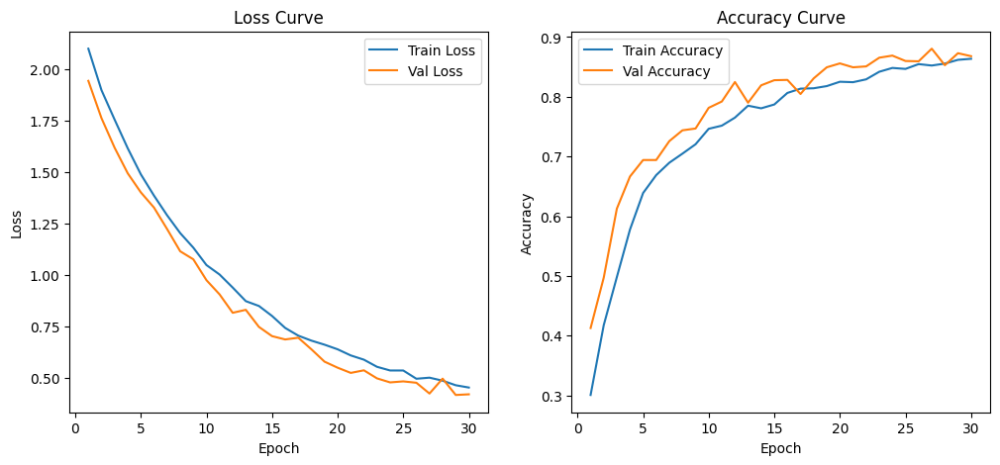

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.plot(range(1,EPOCHS+1), train_losses, label='Train Loss')
plt.plot(range(1,EPOCHS+1), val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss Curve')

plt.subplot(1,2,2)
plt.plot(range(1,EPOCHS+1), train_accuracies, label='Train Accuracy')
plt.plot(range(1,EPOCHS+1), val_accuracies, label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy Curve')

plt.show()


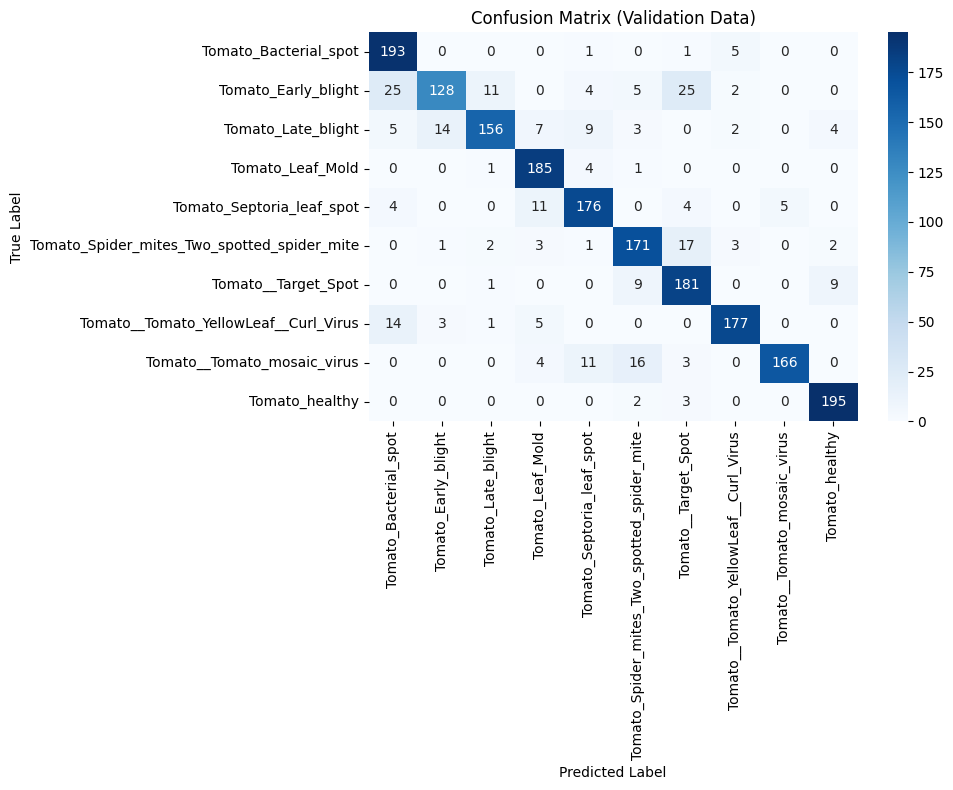

Classification Report:

                                             precision    recall  f1-score   support

                      Tomato_Bacterial_spot       0.80      0.96      0.88       200
                        Tomato_Early_blight       0.88      0.64      0.74       200
                         Tomato_Late_blight       0.91      0.78      0.84       200
                           Tomato_Leaf_Mold       0.86      0.97      0.91       191
                  Tomato_Septoria_leaf_spot       0.85      0.88      0.87       200
Tomato_Spider_mites_Two_spotted_spider_mite       0.83      0.85      0.84       200
                        Tomato__Target_Spot       0.77      0.91      0.83       200
      Tomato__Tomato_YellowLeaf__Curl_Virus       0.94      0.89      0.91       200
                Tomato__Tomato_mosaic_virus       0.97      0.83      0.89       200
                             Tomato_healthy       0.93      0.97      0.95       200

                                   accu

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

class_names = val_dataset.classes
cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)

plt.title("Confusion Matrix (Validation Data)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

print("Classification Report:\n")
print(classification_report(all_labels, all_preds, target_names=class_names))


#امتیازی

In [ ]:
def visualize_patch_embedding(patch_embed_tensor):

    patch_embed = patch_embed_tensor.detach().cpu().numpy()

    pca = PCA(n_components=3)
    patch_embed_3d = pca.fit_transform(patch_embed)

    patch_embed_3d -= patch_embed_3d.min(axis=0)
    patch_embed_3d /= patch_embed_3d.max(axis=0) + 1e-6

    side = int(np.sqrt(patch_embed_3d.shape[0]))
    if side * side != patch_embed_3d.shape[0]:
        print("Warning: Number of patches is not a perfect square. Cannot reshape to square image.")
        side = None

    if side:
        img = patch_embed_3d.reshape(side, side, 3)

        plt.figure(figsize=(6,6))
        plt.imshow(img)
        plt.title("Patch Embedding Visualization (PCA reduced)")
        plt.axis('off')
        plt.show()
    else:
        plt.scatter(patch_embed_3d[:, 0], patch_embed_3d[:, 1], c=patch_embed_3d[:, 2], cmap='viridis')
        plt.title("PCA Visualization of Patch Embeddings (scatter)")
        plt.show()
